## Capstone Project



### Problem Statement

There is an outbreak of bacteria in the community that is affecting children and elderly. The infection can be detected via Chest X ray. The normal chest X-ray depicts clear lungs without any areas of abnormal opacification in the image. Bacterial pneumonia typically exhibits a focal lobar consolidation, in this case in the right upper lobe , whereas viral pneumonia  manifests with a more diffuse ‘‘interstitial’’ pattern in both lungs. We are establishing a diagnostic tool based on a deep-learning framework for the screening of patients that are affected by this bacteria so that doctors can focus on the treatment.

In [1]:
# Import libraries and modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn           as sns
import itertools
import glob
import gc

# For reproducibility
np.random.seed(42)

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras import utils, callbacks
import tensorflow_datasets as tfds
from tensorflow.keras import layers
from tensorflow.keras.applications.vgg19 import VGG19
from PIL import Image
from PIL import ImageFilter, ImageStat
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras import layers, models

from sklearn.metrics         import confusion_matrix, accuracy_score, classification_report,precision_recall_fscore_support

import cv2

import os
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder
import torchvision.models as py_models
from tqdm.notebook import tqdm


In [2]:
from google.colab import drive
drive.mount('/content/drive')
# the base Google Drive directory
root_dir = "/content/drive/My Drive/Colab Notebooks/chest_xray/"
#root_dir = "chest_xray/"
train_dir = root_dir + "train"
test_dir = root_dir + "test"
val_dir = root_dir + "val"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#### Function display_dataset
This function is to to display the no of images or files in the defined folder directory
Input will be folder directory and sub folder directory
Output will be printout of the no of images of files in defined folder directory

In [3]:

def display_dataset (folder_dir, p_class):
    files=0
    images=0
    for num, (dirname, _, filenames,) in enumerate(os.walk(folder_dir + '/'+ p_class)):
        for file, filename in enumerate(filenames):
            if file < 4:
                print(os.path.join(dirname, filename))
            elif file==4:
                print("... more on this folder")
            if filename.endswith(("xlsx", "txt",)):
                files+=1
            elif filename.endswith(("png", "jpeg", "jpg",)):
                images+=1   
       
        print("*"*10, folder_dir, "files: {} images: {}".format(files, images))
        print("...\n")
        return images

#### Function detect_color_image_v1
This function is to determine how many images are color or black and white and output the numbers

In [4]:
def detect_color_image_v1(file, thumb_size=40, MSE_cutoff=22, adjust_color_bias=True):
    pil_img = Image.open(file)
    bands = pil_img.getbands()
    if bands == ('R','G','B') or bands== ('R','G','B','A'):
        thumb = pil_img.resize((thumb_size,thumb_size))
        SSE, bias = 0, [0,0,0]
        if adjust_color_bias:
            bias = ImageStat.Stat(thumb).mean[:3]
            bias = [b - sum(bias)/3 for b in bias ]
        for pixel in thumb.getdata():
            mu = sum(pixel)/3
            SSE += sum((pixel[i] - mu - bias[i])*(pixel[i] - mu - bias[i]) for i in [0,1,2])
        MSE = float(SSE)/(thumb_size*thumb_size)
        if MSE <= MSE_cutoff:
            return("grayscale")
        else:
            return("Color")
    elif len(bands)==1:
        return("Black and white")
    else:
        return("Don't know...")

#### Function Targetization
This function is to determine the no of images in the folder (Normal, Pnuemonia. Output is an array.




In [5]:
# manual cleaning
def Targetization(folder,target_tag):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename),0)
        if img is not None:
            images.append([img,target_tag])
    return images

#### Function : plot_scores

This function will display the accuracy versus Epoch plot and Validation loss verus Epoch plot

In [6]:
def plot_scores(train) :
    accuracy = train.history['accuracy']
    val_accuracy = train.history['val_accuracy']
    epochs = range(len(accuracy))
    plt.plot(epochs, accuracy, 'b', label='Score train')
    plt.plot(epochs, val_accuracy, 'r', label='Score validation')
    plt.title('Scores')
    plt.legend()
    plt.show()

#### Function: set_device

This function will check whether the notebook is using GPU. The DEVICE is set according and used in subsequent function.

In [7]:
def set_device():
  """
  Set the device. CUDA if available, CPU otherwise

  Args:
    None

  Returns:
    Nothing
  """
  device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
  if not torch.cuda.is_available():
    print("WARNING: For this notebook to perform best, "
        "if possible, in the menu under `Runtime` -> "
        "`Change runtime type.`  select `GPU` ")
  else:
    print("GPU is enabled in this notebook.")

  return device

DEVICE = set_device()
print(DEVICE)

GPU is enabled in this notebook.
cuda:0


#### Function : plot_confusion_matrix

This function will plot the confusion matrix plot based on the input result

In [8]:
# Plot confustion matrix graph
def plot_confusion_matrix(cm, classes,normalize=False,title='Confusion matrix',cmap=plt.cm.Oranges):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
       
        plt.imshow(cm, interpolation='nearest', cmap=cmap)
        plt.title(title)
        plt.colorbar()
        tick_marks = np.arange(len(classes))
        plt.xticks(tick_marks, classes, rotation=45)
        plt.yticks(tick_marks, classes)
        
        fmt = '.2f' if normalize else 'd'
        thresh = cm.max()
        for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
            plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")
        plt.tight_layout()
    else:
        plt.imshow(cm, interpolation='nearest', cmap=cmap)
        plt.title(title)
        plt.colorbar()
        tick_marks = np.arange(len(classes))
        plt.xticks(tick_marks, classes, rotation=45)
        plt.yticks(tick_marks, classes)
        
        fmt = '.2f' if normalize else 'd'
        thresh = cm.max()
        for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
            plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")
        plt.tight_layout()

#### Function: LRScheduler

This function will help to set the optimizer based on the inputs.

#### Function : EarlyStopping

This function will help to set the parameters for EarlyStopping

In [9]:
class LRScheduler():
    """
    Learning rate scheduler. If the validation loss does not decrease for the 
    given number of `patience` epochs, then the learning rate will decrease by
    by given `factor`.
    """
    def __init__(
        self, optimizer, patience=5, min_lr=1e-6, factor=0.5
    ):
        """
        new_lr = old_lr * factor

        :param optimizer: the optimizer we are using
        :param patience: how many epochs to wait before updating the lr
        :param min_lr: least lr value to reduce to while updating
        :param factor: factor by which the lr should be updated
        """
        self.optimizer = optimizer
        self.patience = patience
        self.min_lr = min_lr
        self.factor = factor

        self.lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau( 
                self.optimizer,
                mode='min',
                patience=self.patience,
                factor=self.factor,
                min_lr=self.min_lr,
                verbose=True
            )

    def __call__(self, val_loss):
        self.lr_scheduler.step(val_loss)

class EarlyStopping():
    """
    Early stopping to stop the training when the loss does not improve after
    certain epochs.
    """
    def __init__(self, patience=5, min_delta=0):
        """
        :param patience: how many epochs to wait before stopping when loss is
               not improving
        :param min_delta: minimum difference between new loss and old loss for
               new loss to be considered as an improvement
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss == None:
            self.best_loss = val_loss
        elif self.best_loss - val_loss > self.min_delta:
            self.best_loss = val_loss
            # reset counter if validation loss improves
            self.counter = 0
        elif self.best_loss - val_loss < self.min_delta:
            self.counter += 1
            print(f"INFO: Early stopping counter {self.counter} of {self.patience}")
            if self.counter >= self.patience:
                print('INFO: Early stopping')
                self.early_stop = True

#### Function train
This function is to subject the training and validation dataset to be trained in defined model along with other defined hyperparameters. Output will be training/validation loss and accuracy.  

In [10]:
def train(model, criterion, optimizer, device, train_loader, validation_loader, epochs, lr_scheduler_flag=False, early_stopping_flag=False):
    train_loss, validation_loss = [], []
    train_acc, validation_acc = [], []
    for epoch in range(epochs):
        model.train()
        running_loss = 0.

        correct, total = 0, 0 
        with tqdm(train_loader, unit='batch') as tepoch:
            tepoch.set_description('Training: ')
            for data, target in tepoch:
                data, target = data.to(device), target.to(device)
                output = model(data)
                optimizer.zero_grad()
                loss = criterion(output, target)
                loss.backward()
                optimizer.step()
                
                tepoch.set_postfix(loss=loss.item())
                running_loss += loss.item()
                
                _, predicted = torch.max(output, 1)
                total += target.size(0)
                correct += (predicted == target).sum().item()
                
        train_loss.append(running_loss / len(train_loader))  # append the loss for this epoch
        train_acc.append(correct/total)
                
        # evaluate on validation data
        
        model.eval()
        running_loss = 0.
        correct, total = 0, 0 
        with tqdm(validation_loader, unit='batch') as tepoch:
            tepoch.set_description('Validation: ')
            for data, target in tepoch:
                data, target = data.to(device), target.to(device)
                optimizer.zero_grad()
                output = model(data)
                
                loss = criterion(output, target)
                tepoch.set_postfix(loss=loss.item())
                running_loss += loss.item()

                # get accuracy 
                _, predicted = torch.max(output, 1)
                total += target.size(0)
                correct += (predicted == target).sum().item()
        
        validation_loss.append(running_loss/len(validation_loader))
        validation_acc.append(correct/total)
        
        if validation_acc[-1] == 1: break
        if lr_scheduler_flag:
            lr_scheduler(validation_loss[-1])
        if early_stopping_flag:
            early_stopping(validation_loss[-1])
            if early_stopping.early_stop:
                break
    
    return train_loss, train_acc, validation_loss, validation_acc 

#### Function plot_loss_accuracy
This function will take in the training/validation loss and accuracy info and plot the grap on training and validation loss and accuracy.

In [11]:
def plot_loss_accuracy(train_loss, train_acc, validation_loss, validation_acc):
    epochs = len(train_loss)
    fig, (ax1, ax2) = plt.subplots(1, 2)
    ax1.plot(list(range(epochs)), train_loss, label='Training Loss')
    ax1.plot(list(range(epochs)), validation_loss, label='Validation Loss')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.set_title('Epoch vs Loss')
    ax1.legend()

    ax2.plot(list(range(epochs)), train_acc, label='Training Accuracy')
    ax2.plot(list(range(epochs)), validation_acc, label='Validation Accuracy')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Accuracy')
    ax2.set_title('Epoch vs Accuracy')
    ax2.legend()
    fig.set_size_inches(15.5, 5.5)
    plt.show()

#### Function get_y
This function will take in the test dataset to a trained model and output the perdicted value along with the actual value.

In [12]:
def get_y(net, test_loader, device):
    y_pred=torch.zeros(0,dtype=torch.long, device='cpu')
    y_true=torch.zeros(0,dtype=torch.long, device='cpu')
    with torch.no_grad():
      for batch in test_loader:
        data, label = batch
        data, label = data.to(device), label.to(device)
        outputs = net(data)
        _, preds = torch.max(outputs, 1)
        y_pred = torch.cat([y_pred, preds.view(-1).cpu()])
        y_true = torch.cat([y_true, label.view(-1).cpu()])

    return y_pred, y_true

#### Function load_images
This function will take in the directory where the images reside and display the images

In [13]:
def load_images(img_dir, xdim, ydim, nmax=7000) : # 5000
       
    
    label = 0
    label_names = []
    X = []
    y=[]
    for dirname in os.listdir(img_dir):
        print(dirname)
        label_names.append(dirname)
        data_path = os.path.join(img_dir + "/" + dirname,'*g')
        files = glob.glob(data_path)
        n=0
        for f1 in files:
            if n>nmax : break
            img = cv2.imread(f1) 
         
            img= cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            img = cv2.resize(img, (xdim,ydim)) # Re-shape
            X.append(np.array(img))  
            y.append(label) 
            n=n+1
        print(n,' images ')
        label = label+1
    X = np.array(X)
    y = np.array(y)
    gc.collect() 
    return X,y, label, label_names

#### Function plot_barchart
This function will output the barchart based on the input values

In [14]:
def plot_barchart(xrays, labels,title1):
  plt.bar(xrays, labels)
  plt.title(title1)
  plt.xlabel('Category of X-Ray Images', fontsize=15)
  plt.ylabel('Quantity', fontsize=15)
  plt.show()

## Data Cleaning and Exploratory Data Analysis

#### Checking no of images in train, test and validate folders

/content/drive/My Drive/Colab Notebooks/chest_xray/train/NORMAL/IM-0525-0001-0001.jpeg
/content/drive/My Drive/Colab Notebooks/chest_xray/train/NORMAL/IM-0533-0001.jpeg
/content/drive/My Drive/Colab Notebooks/chest_xray/train/NORMAL/IM-0533-0001-0002.jpeg
/content/drive/My Drive/Colab Notebooks/chest_xray/train/NORMAL/IM-0534-0001.jpeg
... more on this folder
********** /content/drive/My Drive/Colab Notebooks/chest_xray/train files: 0 images: 1341
...

/content/drive/My Drive/Colab Notebooks/chest_xray/train/PNEUMONIA/person543_bacteria_2279.jpeg
/content/drive/My Drive/Colab Notebooks/chest_xray/train/PNEUMONIA/person539_bacteria_2270.jpeg
/content/drive/My Drive/Colab Notebooks/chest_xray/train/PNEUMONIA/person53_bacteria_253.jpeg
/content/drive/My Drive/Colab Notebooks/chest_xray/train/PNEUMONIA/person533_virus_1055.jpeg
... more on this folder
********** /content/drive/My Drive/Colab Notebooks/chest_xray/train files: 0 images: 3875
...

/content/drive/My Drive/Colab Notebooks/chest

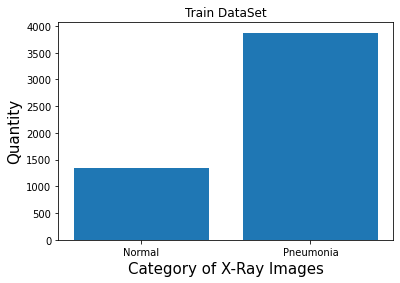

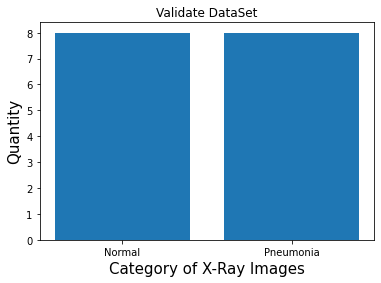

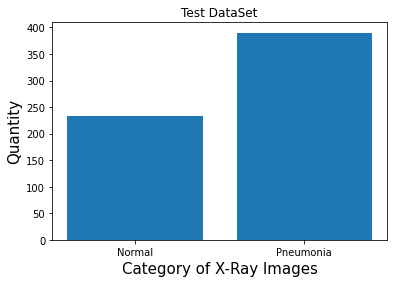

In [ ]:
files = 0
images = 0
train_data=np.array(2)
train_label=np.array(['Normal','Pneumonia'])


train_normal=display_dataset(train_dir,'NORMAL')
train_pneumonia=display_dataset(train_dir,'PNEUMONIA')
train_data=np.array([train_normal,train_pneumonia])
train_label=np.array(['Normal','Pneumonia'])

val_normal=display_dataset(val_dir,'NORMAL')
val_pneumonia=display_dataset(val_dir,'PNEUMONIA')
val_data=np.array([val_normal,val_pneumonia])
val_label=np.array(['Normal','Pneumonia'])


test_normal=display_dataset(test_dir,'NORMAL')
test_pneumonia=display_dataset(test_dir,'PNEUMONIA')
test_data=np.array([test_normal,test_pneumonia])
test_label=np.array(['Normal','Pneumonia'])

plot_barchart(train_label, train_data,"Train DataSet")
plot_barchart(val_label, val_data,"Validate DataSet")
plot_barchart(test_label, test_data,"Test DataSet")




#### Displaying the images based on Color or B/W

In [ ]:
MONOCHROMATIC_MAX_VARIANCE = 0.005
COLOR = 1000
MAYBE_COLOR = 100
        
color=0
b_and_w=0
for im in os.listdir(train_dir + "/NORMAL"):
    path = train_dir + "/NORMAL/" + im
    if detect_color_image_v1(path)=="Color":
      color+=1
    else:
        b_and_w+=1
print("NORMAL train (total img {}) -> color pictures: {} b&w pictures: {}".format(color + b_and_w, color, b_and_w))

color=0
b_and_w=0
for im in os.listdir(val_dir + "/NORMAL"):
    path = val_dir + "/NORMAL/" + im
    if detect_color_image_v1(path)=="Color":
        color+=1
    else:
        b_and_w+=1
print("NORMAL val (total img {}) -> color pictures: {} b&w pictures: {}".format(color + b_and_w, color, b_and_w))

color=0
b_and_w=0
for im in os.listdir(test_dir + "/NORMAL"):
    path = test_dir + "/NORMAL/" + im
    if detect_color_image_v1(path)=="Color":
        color+=1
    else:
        b_and_w+=1
print("NORMAL test (total img {}) -> color pictures: {} b&w pictures: {}".format(color + b_and_w, color, b_and_w))

color=0
b_and_w=0
for im in os.listdir(train_dir + "/PNEUMONIA"):
    path = train_dir + "/PNEUMONIA/" + im
    if detect_color_image_v1(path)=="Color":
      color+=1
    else:
      b_and_w+=1
print("PNEUMONIA train (total img {}) -----> color pictures: {}  b&w pictures: {}".format(color + b_and_w, color, b_and_w))
color=0
b_and_w=0
for im in os.listdir(val_dir + "/PNEUMONIA"):
    path = val_dir + "/PNEUMONIA/" + im
    if detect_color_image_v1(path)=="Color":
        color+=1
    else:
        b_and_w+=1
print("PNEUMONIA val (total img {}) -----> color pictures: {}  b&w pictures: {}".format(color + b_and_w, color, b_and_w))
color=0
b_and_w=0
for im in os.listdir(test_dir + "/PNEUMONIA"):
    path = test_dir + "/PNEUMONIA/" + im
    if detect_color_image_v1(path)=="Color":
        color+=1
    else:
        b_and_w+=1
print("PNEUMONIA test (total img {}) -----> color pictures: {}  b&w pictures: {}".format(color + b_and_w, color, b_and_w))


NORMAL train (total img 1341) -> color pictures: 0 b&w pictures: 1341
NORMAL val (total img 8) -> color pictures: 0 b&w pictures: 8
NORMAL test (total img 234) -> color pictures: 0 b&w pictures: 234
PNEUMONIA train (total img 3875) -----> color pictures: 0  b&w pictures: 3875
PNEUMONIA val (total img 8) -----> color pictures: 0  b&w pictures: 8
PNEUMONIA test (total img 390) -----> color pictures: 0  b&w pictures: 390


In [ ]:
normal = Targetization(train_dir + "/NORMAL", 0)
pneumonia = Targetization(train_dir+ "/PNEUMONIA", 1)
normal_val=Targetization(val_dir + "/NORMAL", 0)
pneumonia_val = Targetization(val_dir + "/PNEUMONIA", 1)
normal_test=Targetization(test_dir+ "/NORMAL", 0)
pneumonia_test = Targetization(test_dir + "/PNEUMONIA", 1)


In [ ]:
num=0
for im in os.listdir(train_dir + "/NORMAL"):
    num+= 1
    if num<10:
      path = train_dir + "/NORMAL/" + im
      first = cv2.imread(path)
      dims = np.shape(first)
      print(dims)
    



(1017, 1268, 3)
(2364, 2518, 3)
(1484, 1756, 3)
(1375, 1624, 3)
(1106, 1492, 3)
(1175, 1728, 3)
(1595, 1902, 3)
(1167, 1628, 3)
(1344, 1670, 3)


Original Image size in train dataset are not consistent across. There is a need to reshape the image to a standard size before submitting for training.

### Displaying and Verifying the images that are stored in the arrays

<Figure size 432x288 with 0 Axes>

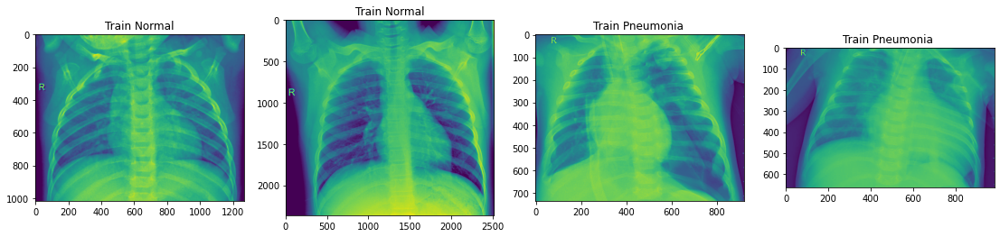

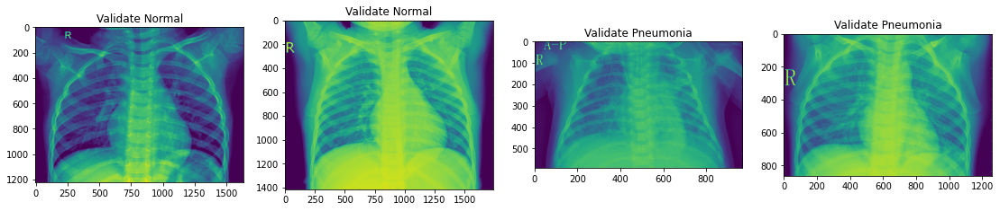

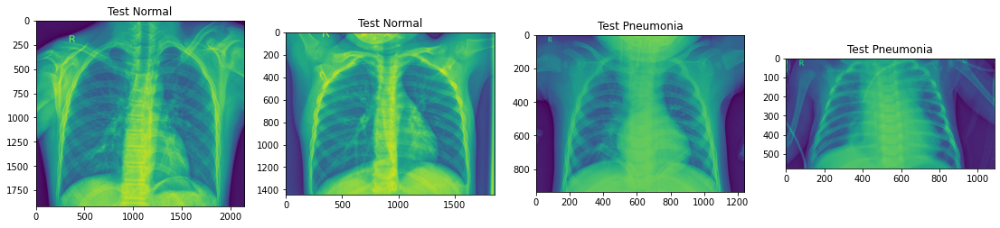

In [ ]:
plt.figure(); 
f, axarr = plt.subplots(1,4, figsize=(19,19));
axarr[0].set_title('Train Normal')
axarr[1].set_title('Train Normal')
axarr[2].set_title('Train Pneumonia ')
axarr[3].set_title('Train Pneumonia ')
axarr[0].imshow(normal[0][0]);
axarr[1].imshow(normal[1][0]);
axarr[2].imshow(pneumonia[0][0]);
axarr[3].imshow(pneumonia[1][0])
plt.show()
f, axarr = plt.subplots(1,4, figsize=(19,19));
axarr[0].set_title('Validate Normal')
axarr[1].set_title('Validate Normal')
axarr[2].set_title('Validate Pneumonia')
axarr[3].set_title('Validate Pneumonia')
axarr[0].imshow(normal_val[0][0]);
axarr[1].imshow(normal_val[1][0]);
axarr[2].imshow(pneumonia_val[0][0]);
axarr[3].imshow(pneumonia_val[1][0])
plt.show()
f, axarr = plt.subplots(1,4, figsize=(19,19));
axarr[0].set_title('Test Normal')
axarr[1].set_title('Test Normal')
axarr[2].set_title('Test Pneumonia')
axarr[3].set_title('Test Pneumonia')
axarr[0].imshow(normal_test[0][0]);
axarr[1].imshow(normal_test[1][0]);
axarr[2].imshow(pneumonia_test[0][0]);
axarr[3].imshow(pneumonia_test[1][0])
plt.show()




Above plot confirms that for Pnenomia cases, there are white patches in the lung area Pneumonia cases as compared to Normal cases

Found 16 images belonging to 2 classes.
Found 16 images belonging to 2 classes.


<Figure size 432x288 with 0 Axes>

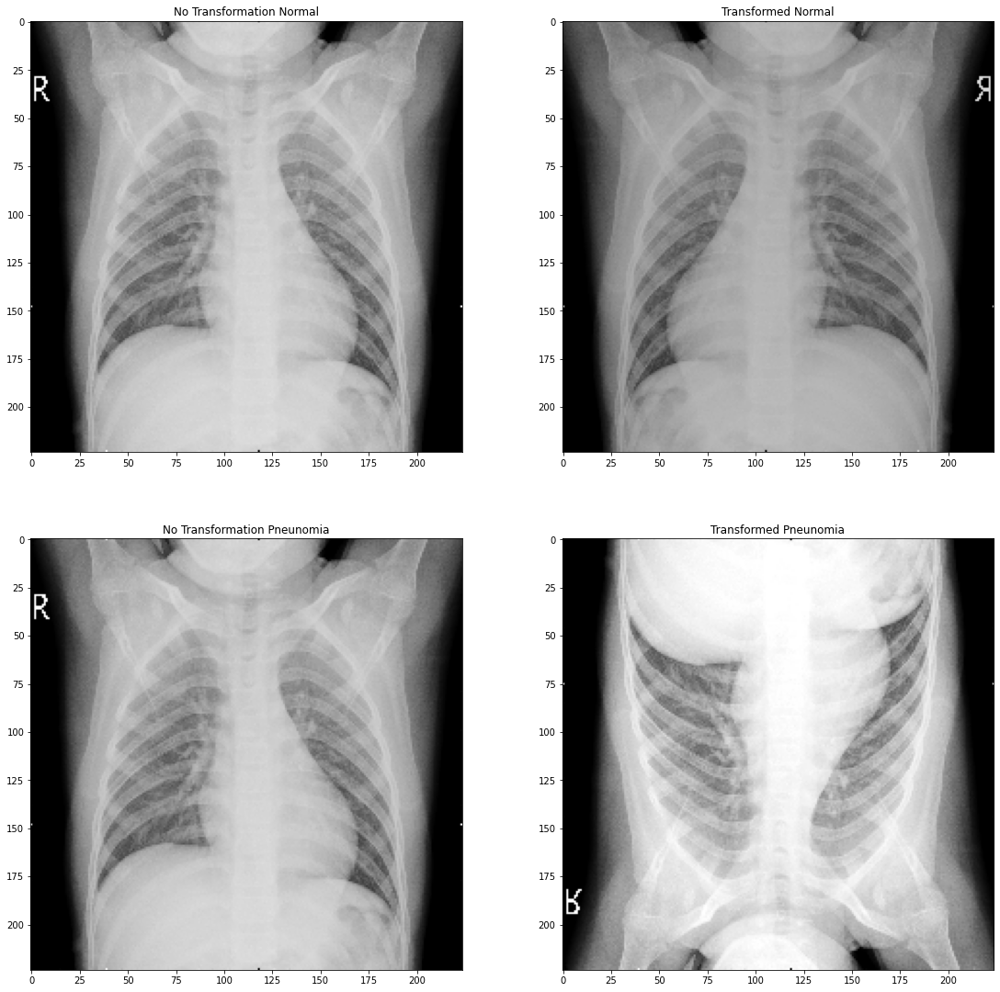

In [ ]:
IMG_HEIGHT = 224
IMG_WIDTH = 224
validate_raw = ImageDataGenerator(rescale=1./255).flow_from_directory(val_dir, shuffle=False, target_size=(IMG_HEIGHT, IMG_WIDTH), batch_size=20, color_mode='rgb', class_mode='binary')
validate_raw_transform=ImageDataGenerator(
    samplewise_center=False,
    featurewise_std_normalization=False,
    samplewise_std_normalization=False,
    zca_whitening=False,
    zca_epsilon=1e-06,
    rotation_range=0,
    width_shift_range=0.0,
    height_shift_range=0.0,
    brightness_range=(0.5,2.0),
    shear_range=0.0,
    zoom_range=0.0,
    channel_shift_range=0,
    fill_mode='nearest',
    cval=0.0,
    horizontal_flip=True,
    vertical_flip=True,
    rescale=1./255,
    preprocessing_function=None,
    data_format=None,
    validation_split=0.0,
    dtype=None
).flow_from_directory(val_dir, shuffle=False, target_size=(IMG_HEIGHT, IMG_WIDTH), batch_size=20, color_mode='rgb', class_mode='binary')


def labeltxt(id):
  if id>0:
    return "Pneunomia"
  else:
    return "Normal"


plt.figure();  
f, axarr = plt.subplots(2,2, figsize=(19,19));
img, label = validate_raw_transform.next()
img1, label1 = validate_raw.next()

firstlabel=''
display0=0
display1=0
for i in range(len(validate_raw.classes)):
  if (validate_raw.classes[i]==0):
    if display0==0:
      axarr[0,0].set_title('No Transformation {}'.format(labeltxt(validate_raw.classes[i])))
      axarr[0,0].imshow(img1[0]);
      axarr[0,1].set_title('Transformed {}'.format(labeltxt(validate_raw_transform.classes[i])))
      axarr[0,1].imshow(img[0]);
      firstlabel=labeltxt(label[0])
      display0=1
  else:
    if (display1==0):
      axarr[1,0].set_title('No Transformation {}'.format(labeltxt(validate_raw.classes[i])))
      axarr[1,0].imshow(img1[0]);
      axarr[1,1].set_title('Transformed {}'.format(labeltxt(validate_raw_transform.classes[i])))
      axarr[1,1].imshow(img[0]);
      display1=1
  img, label = validate_raw_transform.next()
  img1, label1 = validate_raw.next()
    


#### Prepare the data for model training

I perform a normalization of the input data

I am applying data augmentation to the training images. The idea of data augmentation is to artificially increase the number of training images our model sees by applying random transformations to the images. For example, we can randomly rotate or crop the images or flip them horizontally. We want our model to distinguish the objects regardless of orientation and data augmentation can also make a model invariant to transformations of the input data.

The transforms are as follows:
- Resize
- Center crop to 224 x 224
- Convert to a tensor
- Normalize with mean and standard deviation

In [15]:
# Main directory that includes training and validation directories

CHANNEL = 1 # Keep it 3 for colored images, make it 1 for grayscale
IMG_HEIGHT = 224
IMG_WIDTH = 224

validation_batches = ImageDataGenerator(rescale=1./255).flow_from_directory(val_dir, shuffle=False, target_size=(IMG_HEIGHT, IMG_WIDTH), batch_size=2, color_mode='rgb', class_mode='binary')
test_batches = ImageDataGenerator(rescale=1./255).flow_from_directory(test_dir, shuffle=False, target_size=(IMG_HEIGHT, IMG_WIDTH), batch_size=2, color_mode='rgb', class_mode='binary')

training_batches=ImageDataGenerator(
    samplewise_center=False,
    featurewise_std_normalization=False,
    samplewise_std_normalization=False,
    zca_whitening=False,
    zca_epsilon=1e-06,
    rotation_range=0,
    width_shift_range=0.0,
    height_shift_range=0.0,
    brightness_range=(0.5,2.0),
    shear_range=0.0,
    zoom_range=0.0,
    channel_shift_range=150,
    fill_mode='nearest',
    cval=0.0,
    horizontal_flip=True,
    vertical_flip=True,
    rescale=1./255,
    preprocessing_function=None,
    data_format=None,
    validation_split=0.0,
    dtype=None
).flow_from_directory(train_dir, shuffle=True, target_size=(IMG_HEIGHT, IMG_WIDTH), batch_size=20, color_mode='rgb', class_mode='binary')


Found 16 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
Found 5216 images belonging to 2 classes.


Above images shows the transformation being done on the images before subjecting the train dataset to the modelling process. The images are made brighter so that it is more distinquishable in a Pneunomia cases. On top of this, the transformation also takes are care of Horizontal/Vertical Flip, normalisation.

## Modelling

##### Base Model  - CNN architecture

- A fixed size of (224 * 224) RGB image was given as input to this network which means that the matrix was of shape (224,224,3).
- Used kernels of (5 * 5) size with a stride size of 1 pixel, this enabled them to cover the whole notion of the image.
-  this was followed by Rectified linear unit(ReLu) to introduce non-linearity to make the model classify better 
- final layer is a softmax function.

In [38]:
Conv2D_layer_1=layers.Conv2D(32, (3, 3), input_shape=(224, 224, 3), activation='relu')
flatten_layer = layers.Flatten()
prediction_layer = layers.Dense(2, activation='softmax')

model1 = models.Sequential([
    Conv2D_layer_1,
    flatten_layer,
    prediction_layer
])


In [39]:
# Add learning rate for Adam
adam = tf.keras.optimizers.Adam(learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005)
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy()
model1.compile(optimizer="adam", loss=loss_fn, metrics=['accuracy'])
model1.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 flatten_4 (Flatten)         (None, 1577088)           0         
                                                                 
 dense_16 (Dense)            (None, 2)                 3154178   
                                                                 
Total params: 3,155,074
Trainable params: 3,155,074
Non-trainable params: 0
_________________________________________________________________


In [40]:

# Fit the model
history = model1.fit(training_batches,
  validation_data=validation_batches, epochs=40, batch_size=20
)

loss, acc = model1.evaluate(test_batches)
print("Accuracy", acc)


Epoch 1/40
261/261 [==============================] - 70s 267ms/step - loss: 1.6977 - accuracy: 0.8324 - val_loss: 0.7581 - val_accuracy: 0.6250
Epoch 2/40
261/261 [==============================] - 69s 265ms/step - loss: 0.2091 - accuracy: 0.9227 - val_loss: 0.5264 - val_accuracy: 0.6250
Epoch 3/40
261/261 [==============================] - 70s 269ms/step - loss: 0.1868 - accuracy: 0.9348 - val_loss: 0.4771 - val_accuracy: 0.6875
Epoch 4/40
261/261 [==============================] - 70s 269ms/step - loss: 0.1660 - accuracy: 0.9431 - val_loss: 0.6159 - val_accuracy: 0.6250
Epoch 5/40
261/261 [==============================] - 70s 269ms/step - loss: 0.1193 - accuracy: 0.9582 - val_loss: 0.7328 - val_accuracy: 0.6875
Epoch 6/40
261/261 [==============================] - 70s 268ms/step - loss: 0.1061 - accuracy: 0.9643 - val_loss: 0.7241 - val_accuracy: 0.6875
Epoch 7/40
261/261 [==============================] - 70s 269ms/step - loss: 0.1102 - accuracy: 0.9659 - val_loss: 0.5727 - val_ac

In [41]:
scores = model1.evaluate(test_batches, verbose=0)
print("Score : %.2f%%" % (scores[1]*100))

Score : 71.63%


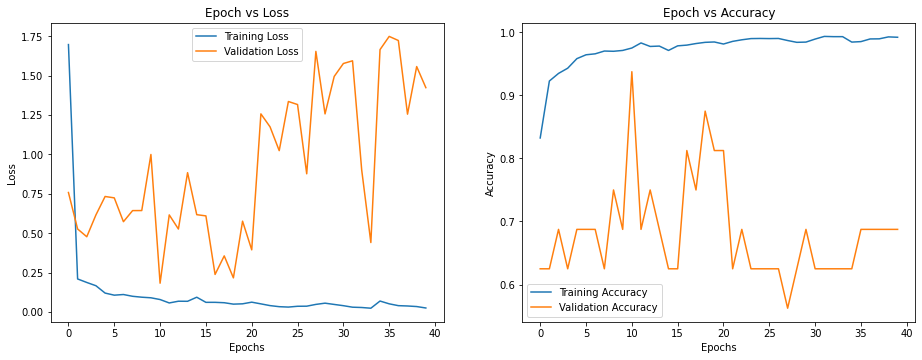

In [42]:
# a plot on train/test accuracy and loss verus epoch
plot_loss_accuracy(history.history['loss'], history.history['accuracy'], history.history['val_loss'], history.history['val_accuracy'])

Summary of results on Epoch vs Loss and Epoch vs Accuracy Graph
- The graphs seemed to suggest that overfitting seemed to occur since Training Accuracy/Loss improve while Validation Accuracy/Loss got worst as epoch increases.


In [43]:
# compute confusion matrix
pred_classes_1 = model1.predict(test_batches)
pred1 = np.argmax(pred_classes_1, axis=-1)

print('Confusion Matrix')
print(confusion_matrix(test_batches.classes, pred1))
print('Classification Report')
target_names = ['NORMAL', 'PNEUMONIA']
print(classification_report(test_batches.classes, pred1, target_names=target_names))

Confusion Matrix
[[ 70 164]
 [ 13 377]]
Classification Report
              precision    recall  f1-score   support

      NORMAL       0.84      0.30      0.44       234
   PNEUMONIA       0.70      0.97      0.81       390

    accuracy                           0.72       624
   macro avg       0.77      0.63      0.63       624
weighted avg       0.75      0.72      0.67       624



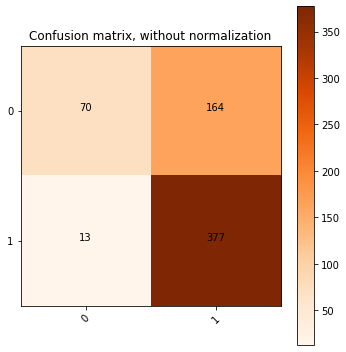

In [44]:
# Compute confusion matrix
class_names_1 = np.unique(test_batches.classes)

cnf_matrix_1 = confusion_matrix(test_batches.classes, pred1)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure(figsize=(5,5))
plot_confusion_matrix(cnf_matrix_1, classes=class_names_1, title='Confusion matrix, without normalization')

In [45]:
# Examine some classification metrics 
tn, fp, fn, tp = confusion_matrix(y_true=test_batches.classes, y_pred=pred1).ravel()
print('Accuracy: {}'.format(round((tp+tn)/(tp+fp+tn+fn),4)))
print('Misclassification rate: {}'.format(round((fp+fn)/(tp+fp+tn+fn),4)))
print('Precision: {}'.format(round(tp/(tp+fp),4)))
print('Recall: {}'.format(round(tp/(tp+fn),4)))
print('Specificity: {}'.format(round(tn/(tn+fp),4)))

Accuracy: 0.7163
Misclassification rate: 0.2837
Precision: 0.6969
Recall: 0.9667
Specificity: 0.2991


This model is my base model using Covolutional Neural Network configured with 40 epoch. It is a simple architecture
Layer Output Shape
Layer 1 - Conv2D(32, (3, 3)
Layer 2- Flatten
Layer 3- Dense layer, Output Shape 2


The accuracy is 0.7163. The plot on acccuracy versus epoch shows validation accuracy declines as train accuracy increases. The plot on loss versus epoch shows that train loss declines while validation loss increases.

Next step, I will attempt to introduce more layers to the model. Objective is to improve the plot on train/val accuracy and loss.



Model 1

- A fixed size of (224 * 224) image was given as input to this network which means that the matrix was of shape (224,224,3).
- Used kernels of (5 * 5) size with 32 filters with a stride size of 1 pixel, this enabled them to cover the whole notion of the image.
- max pooling was performed over a 2 * 2 pixel windows 
- This is followed by Dropout of 0.2 
- This is followed with Flatten process
- This is followed by Rectified linear unit(ReLu) to introduce non-linearity to make the model classify better 
- The final layer is a softmax function.


<img src="model1.jpg"/>

In [ ]:
Conv2D_layer_1= layers.Conv2D(32, (5, 5), input_shape=(224, 224, 3), strides=(1,1), activation='relu', padding='same')
maxpool_layer_1=layers.MaxPool2D(pool_size=(2, 2))
dropout_layer_1=layers.Dropout(0.2)
flatten_layer = layers.Flatten()
dense_layer_1 = layers.Dense(128, activation='relu')
prediction_layer = layers.Dense(2, activation='softmax')


model2 = models.Sequential([
    Conv2D_layer_1,
    maxpool_layer_1,
    dropout_layer_1,
    flatten_layer,
    dense_layer_1,
    prediction_layer
])


In [ ]:
# Add learning rate for Adam
adam = tf.keras.optimizers.Adam(learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005)
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy()
model2.compile(optimizer="adam", loss=loss_fn, metrics=['accuracy'])
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 224, 224, 32)      2432      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 32)     0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 112, 112, 32)      0         
                                                                 
 flatten_2 (Flatten)         (None, 401408)            0         
                                                                 
 dense_2 (Dense)             (None, 128)               51380352  
                                                                 
 dense_3 (Dense)             (None, 2)                 258       
                                                      

In [ ]:
# Fit the model
history = model2.fit(training_batches,
  validation_data=validation_batches, epochs=40, batch_size=20
)

loss, acc = model2.evaluate(test_batches)
print("Accuracy", acc)


Epoch 1/40
261/261 [==============================] - 83s 315ms/step - loss: 0.5618 - accuracy: 0.8723 - val_loss: 0.5603 - val_accuracy: 0.6875
Epoch 2/40
261/261 [==============================] - 83s 318ms/step - loss: 0.2240 - accuracy: 0.9116 - val_loss: 0.8044 - val_accuracy: 0.6250
Epoch 3/40
261/261 [==============================] - 83s 316ms/step - loss: 0.1872 - accuracy: 0.9241 - val_loss: 0.6714 - val_accuracy: 0.6875
Epoch 4/40
261/261 [==============================] - 81s 311ms/step - loss: 0.1590 - accuracy: 0.9406 - val_loss: 1.2373 - val_accuracy: 0.6250
Epoch 5/40
261/261 [==============================] - 82s 313ms/step - loss: 0.1459 - accuracy: 0.9471 - val_loss: 1.6164 - val_accuracy: 0.6250
Epoch 6/40
261/261 [==============================] - 82s 314ms/step - loss: 0.1146 - accuracy: 0.9584 - val_loss: 1.0046 - val_accuracy: 0.6250
Epoch 7/40
261/261 [==============================] - 82s 313ms/step - loss: 0.1130 - accuracy: 0.9563 - val_loss: 0.7505 - val_ac

In [ ]:
scores = model2.evaluate(test_batches, verbose=0)
print("Score : %.2f%%" % (scores[1]*100))

Score : 68.11%


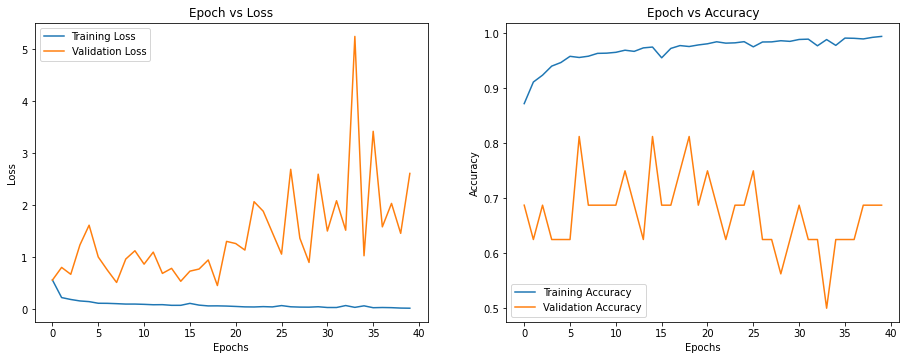

In [ ]:
# a plot on train/test accuracy and loss verus epoch
plot_loss_accuracy(history.history['loss'], history.history['accuracy'], history.history['val_loss'], history.history['val_accuracy'])

Summary of results on Epoch vs Loss and Epoch vs Accuracy Graph

The graphs seemed to suggest that overfitting seemed to occur since Training Accuracy/Loss improve while Validation Accuracy/Loss got worst as epoch increases.

In [ ]:
# compute confusion matrix
pred_classes_1 = model1.predict(test_batches)
pred1 = np.argmax(pred_classes_1, axis=-1)

print('Confusion Matrix')
print(confusion_matrix(test_batches.classes, pred1))
print('Classification Report')
target_names = ['NORMAL', 'PNEUMONIA']
print(classification_report(test_batches.classes, pred1, target_names=target_names))

Confusion Matrix
[[ 71 163]
 [ 17 373]]
Classification Report
              precision    recall  f1-score   support

      NORMAL       0.81      0.30      0.44       234
   PNEUMONIA       0.70      0.96      0.81       390

    accuracy                           0.71       624
   macro avg       0.75      0.63      0.62       624
weighted avg       0.74      0.71      0.67       624



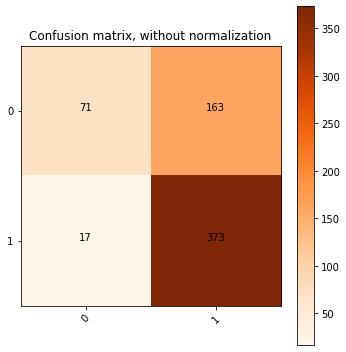

In [ ]:
# Compute confusion matrix
class_names_1 = np.unique(test_batches.classes)

cnf_matrix_1 = confusion_matrix(test_batches.classes, pred1)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure(figsize=(5,5))
plot_confusion_matrix(cnf_matrix_1, classes=class_names_1, title='Confusion matrix, without normalization')

In [ ]:
# Examine some classification metrics 
tn, fp, fn, tp = confusion_matrix(y_true=test_batches.classes, y_pred=pred1).ravel()
print('Accuracy: {}'.format(round((tp+tn)/(tp+fp+tn+fn),4)))
print('Misclassification rate: {}'.format(round((fp+fn)/(tp+fp+tn+fn),4)))
print('Precision: {}'.format(round(tp/(tp+fp),4)))
print('Recall: {}'.format(round(tp/(tp+fn),4)))
print('Specificity: {}'.format(round(tn/(tn+fp),4)))

Accuracy: 0.7115
Misclassification rate: 0.2885
Precision: 0.6959
Recall: 0.9564
Specificity: 0.3034


The accuracy is 0.7115. The plot on acccuracy versus epoch shows validation accuracy declines as train accuracy increases. 
The validation loss increases as the train model loss decreases.
Although the accuracy improves slightly, the plot on accuracy and loss is still not desirable.



|Model|---|HyperParameters|Epoch|Accuracy|Misclass|Precision|Recall|Specificity|Observation Accuracy|Observation on Loss|Remarks|
|---|---|---|---|---|---|---|---|---|---|---|---|
|Base Model|CNN-3 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005|40|0.7163|0.2837|0.6969|0.9667|0.2991|Train Accuracy increases and Test Accuracy decreases|Both Train and Test decreases|---|
|Model Selection|---|---|---|---|---|---|---|---|---|---|---|---|
|Model 1|CNN- 6 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005|40|0.7115|0.2885|0.6959|0.9564|0.3034|Train Accuracy increases and Test Accuracy decreases|Train loss decreases while Test loss increases|---|



Model 2

- A fixed size of (224 * 224) image was given as input to this network which means that the matrix was of shape (224,224,3).
- Used kernels of (5 * 5) size with 96 filters with a stride size of 1 pixel, this enabled them to cover the whole notion of the image.
- max pooling was performed over a 2 * 2 pixel windows 
- This is followed by Dropout of 0.2 
- This is followed by BatchNormalisation
- This is followed by adding 2nd Con2D layer with 192 neurons with kernal 5x5 with stride1 and padding
- Add another Conv2D layer with 192 neurons, kernel size 5,5 and strides 1,1
- Add Max pool of size 2x2
- Add dropout to 0.4
- Add Batch Normalization for the 2nd Conv2D layers
- This is followed with Flatten process
- Add lst Dense layer of 256 neurons 
-  Add dropout of 0.4
- Add Batch Normalization for the Dense layers
-  Add 2nd Dense layer with 128 neurons
-  Add dropout of 0.4 for the Dense layers
-  Add Batch Normalization for the Dense layers
=  Add 3rd Dense layer of 64 neurons 
- Add dropout of 0.4 for Dense layers
- Add Batch Normalization for the Dense layers
- the final layer is a softmax function.

<img src="model2.jpg"/>

In [ ]:
Conv2D_layer_1= layers.Conv2D(96, (5, 5), input_shape=(224, 224, 3), strides=(1,1), activation='relu', padding='same')
maxpool_layer_1=layers.MaxPool2D(pool_size=(2, 2))
batchnormal_layer_1=layers.BatchNormalization()
Conv2D_layer_2=layers.Conv2D(192, (5, 5), strides=(1,1), activation='relu', padding='same')
Conv2D_layer_3=layers.Conv2D(192, (5, 5), strides=(1,1), activation='relu', padding='same')
maxpool_layer_2=layers.MaxPool2D(pool_size=(2, 2))
dropout_layer_1=layers.Dropout(0.4)
batchnormal_layer_2=layers.BatchNormalization()
flatten_layer = layers.Flatten()
dense_layer_1 = layers.Dense(256, activation='relu')
dropout_layer_2=layers.Dropout(0.4)
batchnormal_layer_3=layers.BatchNormalization()
dense_layer_2 = layers.Dense(128, activation='relu')
dropout_layer_3=layers.Dropout(0.4)
batchnormal_layer_4=layers.BatchNormalization()
dense_layer_3 = layers.Dense(64, activation='relu')
dropout_layer_4=layers.Dropout(0.4)
batchnormal_layer_5=layers.BatchNormalization()
prediction_layer = layers.Dense(2, activation='softmax')


model3 = models.Sequential([
    Conv2D_layer_1,
    maxpool_layer_1,
    batchnormal_layer_1,
    Conv2D_layer_2,
    Conv2D_layer_3,
    maxpool_layer_2,
    dropout_layer_1,
    batchnormal_layer_2,
    flatten_layer,
    dense_layer_1,
    dropout_layer_2,
    batchnormal_layer_3,
    dense_layer_2,
    dropout_layer_3,
    batchnormal_layer_4,
    dense_layer_3,
    dropout_layer_4,
    batchnormal_layer_5,
    prediction_layer
])


In [ ]:
# Add learning rate for Adam
adam = tf.keras.optimizers.Adam(learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005)
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy()
model3.compile(optimizer="adam", loss=loss_fn, metrics=['accuracy'])
model3.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 224, 224, 96)      7296      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 112, 112, 96)     0         
 2D)                                                             
                                                                 
 batch_normalization (BatchN  (None, 112, 112, 96)     384       
 ormalization)                                                   
                                                                 
 conv2d_4 (Conv2D)           (None, 112, 112, 192)     460992    
                                                                 
 conv2d_5 (Conv2D)           (None, 112, 112, 192)     921792    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 56, 56, 192)     

In [ ]:
# Fit the model

history = model3.fit(training_batches,
  validation_data=validation_batches, epochs=40, batch_size=20
)

loss, acc = model3.evaluate(test_batches)
print("Accuracy", acc)

Epoch 1/40
261/261 [==============================] - 87s 321ms/step - loss: 0.6976 - accuracy: 0.6557 - val_loss: 0.9918 - val_accuracy: 0.5000
Epoch 2/40
261/261 [==============================] - 83s 317ms/step - loss: 0.4873 - accuracy: 0.7719 - val_loss: 1.1433 - val_accuracy: 0.5000
Epoch 3/40
261/261 [==============================] - 83s 317ms/step - loss: 0.3933 - accuracy: 0.8246 - val_loss: 0.7238 - val_accuracy: 0.6250
Epoch 4/40
261/261 [==============================] - 82s 314ms/step - loss: 0.3753 - accuracy: 0.8307 - val_loss: 0.3800 - val_accuracy: 0.8125
Epoch 5/40
261/261 [==============================] - 82s 314ms/step - loss: 0.3383 - accuracy: 0.8491 - val_loss: 0.8675 - val_accuracy: 0.6250
Epoch 6/40
261/261 [==============================] - 82s 314ms/step - loss: 0.3204 - accuracy: 0.8583 - val_loss: 0.4050 - val_accuracy: 0.7500
Epoch 7/40
261/261 [==============================] - 82s 314ms/step - loss: 0.3379 - accuracy: 0.8495 - val_loss: 1.2070 - val_ac

In [ ]:
scores = model3.evaluate(test_batches, verbose=0)
print("Score : %.2f%%" % (scores[1]*100))

Score : 73.08%


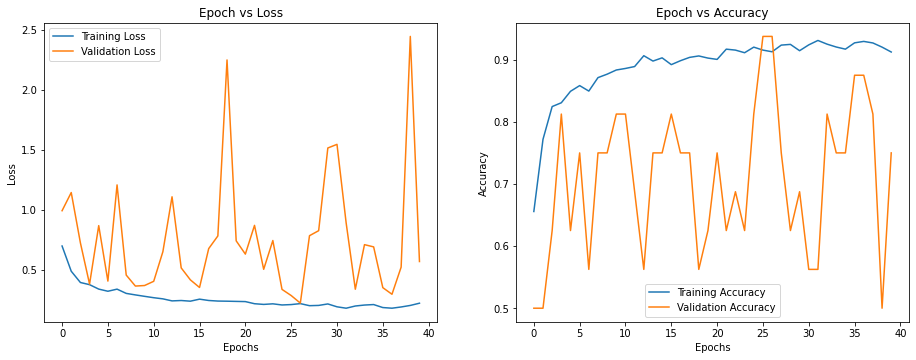

In [ ]:
# a plot on train/validate accuracy and loss verus epoch
plot_loss_accuracy(history.history['loss'], history.history['accuracy'], history.history['val_loss'], history.history['val_accuracy'])

Summary of results on Epoch vs Loss and Epoch vs Accuracy Graph

The graphs show that the trend of Validation loss/accuracy is moving in the same direction as training loss/accuracy. So, further tuning in the direction is improve the modelling.

Using a limited dataset will not be sufficient to achieve a good trained model. To accumulate more trained data, tt requires that expert doctors classify each image, which is an expensive and time-consuming task. Transfer learning is a work-around to surmount this obstacle. So in order to solve a problem that involves a small dataset, a model trained on a large dataset is re-used and the network weights determined in this model are applied. This will be my next step for the modelling process.

In [ ]:
## compute confusion matrix
pred_classes_1 = model3.predict(test_batches)
pred1 = np.argmax(pred_classes_1, axis=-1)

print('Confusion Matrix')
print(confusion_matrix(test_batches.classes, pred1))
print('Classification Report')
target_names = ['NORMAL', 'PNEUMONIA']
print(classification_report(test_batches.classes, pred1, target_names=target_names))

Confusion Matrix
[[ 67 167]
 [  1 389]]
Classification Report
              precision    recall  f1-score   support

      NORMAL       0.99      0.29      0.44       234
   PNEUMONIA       0.70      1.00      0.82       390

    accuracy                           0.73       624
   macro avg       0.84      0.64      0.63       624
weighted avg       0.81      0.73      0.68       624



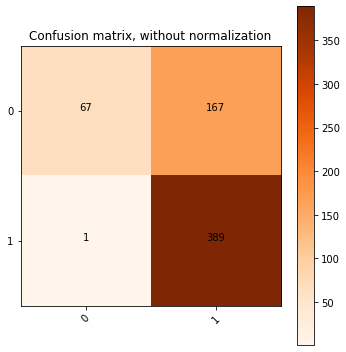

In [ ]:
# Compute confusion matrix
class_names_1 = np.unique(test_batches.classes)

cnf_matrix_1 = confusion_matrix(test_batches.classes, pred1)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure(figsize=(5,5))
plot_confusion_matrix(cnf_matrix_1, classes=class_names_1, title='Confusion matrix, without normalization')

In [ ]:
# Examine some classification metrics 
tn, fp, fn, tp = confusion_matrix(y_true=test_batches.classes, y_pred=pred1).ravel()
print('Accuracy: {}'.format(round((tp+tn)/(tp+fp+tn+fn),4)))
print('Misclassification rate: {}'.format(round((fp+fn)/(tp+fp+tn+fn),4)))
print('Precision: {}'.format(round(tp/(tp+fp),4)))
print('Recall: {}'.format(round(tp/(tp+fn),4)))
print('Specificity: {}'.format(round(tn/(tn+fp),4)))

Accuracy: 0.7308
Misclassification rate: 0.2692
Precision: 0.6996
Recall: 0.9974
Specificity: 0.2863


The accuracy is 0.7388%. The plot on acccuracy versus epoch shows both validate accuracy and train accuracy increases. Both validate loss and train loss decreases.

|Model|---|HyperParameters|Epoch|Accuracy|Misclass|Precision|Recall|Specificity|Observation Accuracy|Observation on Loss|Remarks|
|---|---|---|---|---|---|---|---|---|---|---|---|
|Base Model|CNN-3 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005|40|0.7163|0.2837|0.6969|0.9667|0.2991|Train Accuracy increases and Test Accuracy decreases|Both Train and Test decreases|---|
|Model Selection|---|---|---|---|---|---|---|---|---|---|---|---|
|Model 1|CNN- 6 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005|40|0.7115|0.2885|0.6959|0.9564|0.3034|Train Accuracy increases and Test Accuracy decreases|Train loss decreases while Test loss increases|---|
|Model 2|CNN- 6 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005 |40|0.7308|0.2692|0.6996|0.9974|0.2863|Train Accuracy increases and Test Accuracy decreases|Train loss decreases while Test loss increases|---|





#### Preparing for modelling in Pre-Trained Model

I am using VGG-19 pre-trained model for model 3 and model 4 under the PyTorch library.

To process an image in PyTorch, we use transforms , simple operations applied to arrays. The validation (and testing) transforms are as follows:
- Resize
- Center crop to 224 x 224
- Convert to a tensor
- Normalize with mean and standard deviation

I create datasets and DataLoaders . By using datasets.ImageFolder to make a dataset, PyTorch will automatically associate images with the correct labels provided our directory is set up as above. The datasets are then passed to a DataLoader , an iterator that yield batches of images and labels.

In [ ]:
train_transform = transforms.Compose((
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.RandomAffine(
        20, 
        shear=10,
        interpolation=transforms.InterpolationMode.NEAREST
    ),
    transforms.RandomHorizontalFlip(p=0.2),
    transforms.RandomVerticalFlip(p=0.2),
    transforms.ColorJitter(brightness=[0.5,2.0]),
    transforms.ToTensor()
))


train_image = ImageFolder(train_dir, transform=train_transform)

val_transform = transforms.Compose((
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor()
))

val_image = ImageFolder(val_dir, transform=val_transform)

test_image = ImageFolder(test_dir, transform=val_transform)

In [ ]:
train_loader = torch.utils.data.DataLoader(
    train_image,                                  
    batch_size=32,
    shuffle=True,
    num_workers=2,
)

val_loader = torch.utils.data.DataLoader(
    val_image,                                  
    batch_size=2,
    shuffle=True,
    num_workers=2,
)

test_loader = torch.utils.data.DataLoader(
    test_image,                                  
    batch_size=2,
    shuffle=True,
    num_workers=2,
)

##### Model 3 : VGG 19

- A fixed size of (224 * 224) RGB image was given as input to this network which means that the matrix was of shape (224,224,3).
- The only preprocessing that was done is that they subtracted the mean RGB value from each pixel, computed over the whole training set.
- Used kernels of (3 * 3) size with a stride size of 1 pixel, this enabled them to cover the whole notion of the image.
- spatial padding was used to preserve the spatial resolution of the image.
- max pooling was performed over a 2 * 2 pixel windows with sride 2.
- this was followed by Rectified linear unit(ReLu) to introduce non-linearity to make the model classify better and to  - improve computational time as the previous models used tanh or sigmoid functions this proved much better than those.
- implemented three fully connected layers from which first two were of size 4096 and after that a layer with 1000 channels for 1000-way ILSVRC classification and the final layer is a softmax function.


<img src="model3.jpg"/>

In [ ]:
vgg_model = py_models.vgg19(pretrained=True)
for param in vgg_model.parameters():
  param.requires_grad = False

for param in vgg_model.classifier.parameters():
    param.requires_grad = True

num_ftrs = vgg_model.classifier[-1].in_features

vgg_model.classifier[-1] = nn.Sequential(
    nn.Linear(num_ftrs, 2)
)

vgg_model = vgg_model.to('cuda')

print(vgg_model)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [ ]:
optimizer = torch.optim.Adam(vgg_model.parameters(), lr=1e-6)
lr_scheduler = LRScheduler(optimizer)
early_stopping = EarlyStopping(patience=3)
loss_fn = nn.CrossEntropyLoss()
print(optimizer)

Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 1e-06
    maximize: False
    weight_decay: 0
)


  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

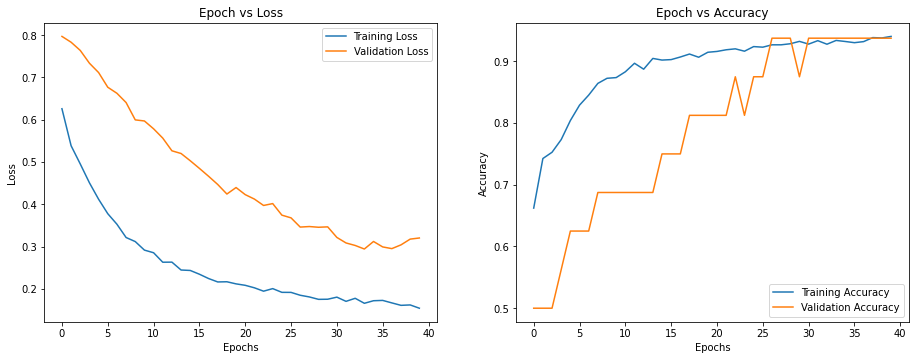

In [ ]:
train_loss, train_acc, validation_loss, validation_acc = train(
    vgg_model, loss_fn, optimizer, 'cuda', train_loader, val_loader, 40,
    lr_scheduler_flag=True, early_stopping_flag=False
)
plot_loss_accuracy(train_loss, train_acc, validation_loss, validation_acc)

#### Evaluating VGG-19 model

In [ ]:
with torch.no_grad():
    loss_sum = 0
    total_correct = 0
    total = len(test_image)
    for batch in test_loader:
      images, labels = batch
      images = images.to(DEVICE)
      labels = labels.to(DEVICE)
      output = vgg_model(images)
      loss = loss_fn(output, labels)
      loss_sum += loss.item()

      predictions = torch.argmax(output, dim=1)

      num_correct = torch.sum(predictions == labels)
      total_correct += num_correct.cpu()

pct = total_correct / total
print(f'\n Final accuracy is {pct}')


 Final accuracy is 0.8509615659713745


In [ ]:
y_pred, y_true = get_y(vgg_model, test_loader, DEVICE)
confusion_matrix_df = pd.DataFrame(confusion_matrix(y_true, y_pred))

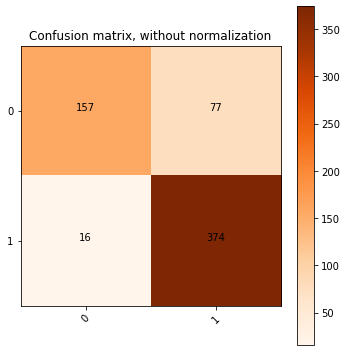

In [ ]:
# Compute confusion matrix
class_names_1 = np.unique(y_true)

cnf_matrix_1 = confusion_matrix(y_true=y_true, y_pred=y_pred)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure(figsize=(5,5))
plot_confusion_matrix(cnf_matrix_1, classes=class_names_1, title='Confusion matrix, without normalization')

In [ ]:
# Examine some classification metrics 
tn, fp, fn, tp = confusion_matrix(y_true=y_true, y_pred=y_pred).ravel()
print('Accuracy: {}'.format(round((tp+tn)/(tp+fp+tn+fn),4)))
print('Misclassification rate: {}'.format(round((fp+fn)/(tp+fp+tn+fn),4)))
print('Precision: {}'.format(round(tp/(tp+fp),4)))
print('Recall: {}'.format(round(tp/(tp+fn),4)))
print('Specificity: {}'.format(round(tn/(tn+fp),4)))

Accuracy: 0.851
Misclassification rate: 0.149
Precision: 0.8293
Recall: 0.959
Specificity: 0.6709


In [ ]:
precision_recall_fscore_support(y_true, y_pred, average="binary")

(0.8292682926829268, 0.958974358974359, 0.8894173602853745, None)

Model 3 accuracy and recall has improved a lot compared to Model 2. The accuracy/loss plot is much better as both validation and train set is moving in the same direction. Train loss decreases while validation loss decreases. Train accuracy increases while validation accuracy increases. I notice that in the validation accuracy starts to deteriorates at the last leg of the epoch. So, I will introduce early stopping in Model 4.

|Model|---|HyperParameters|Epoch|Accuracy|Misclass|Precision|Recall|Specificity|Observation Accuracy|Observation on Loss|Remarks|
|---|---|---|---|---|---|---|---|---|---|---|---|
|Base Model|CNN-3 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005|40|0.7163|0.2837|0.6969|0.9667|0.2991|Train Accuracy increases and Test Accuracy decreases|Both Train and Test decreases|---|
|Model Selection|---|---|---|---|---|---|---|---|---|---|---|---|
|Model 1|CNN- 6 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005|40|0.7115|0.2885|0.6959|0.9564|0.3034|Train Accuracy increases and Test Accuracy decreases|Train loss decreases while Test loss increases|---|
|Model 2|CNN- 6 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005 |40|0.7308|0.2692|0.6996|0.9974|0.2863|Train Accuracy increases and Test Accuracy decreases|Train loss decreases while Test loss increases|---|
|Model 3|VGG-19|learning rate:1e-06, betas: (0.9, 0.999), epsilon: 1e-08, decay=0.000005|40|0.851|0.149|0.8293|0.959|0.6709|Train Accurancy increases and Test Accuracy increases|Train loss decreases while Test loss decreases|---|





#### Model 4

- It is similiar to Model 3 exept that I added the parameter Early Stopping. 

In [ ]:
vgg_model2 = py_models.vgg19(pretrained=True)
for param in vgg_model2.parameters():
  param.requires_grad = False

for param in vgg_model2.classifier.parameters():
    param.requires_grad = True

num_ftrs = vgg_model2.classifier[-1].in_features

vgg_model2.classifier[-1] = nn.Sequential(
    nn.Linear(num_ftrs, 2)
)
vgg_model2 = vgg_model2.to(DEVICE)

print(vgg_model2)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [ ]:
optimizer = torch.optim.Adam(vgg_model2.parameters(), lr=1e-6)
lr_scheduler = LRScheduler(optimizer)
early_stopping = EarlyStopping(patience=3)
loss_fn = nn.CrossEntropyLoss()

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

INFO: Early stopping counter 1 of 3


  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

INFO: Early stopping counter 1 of 3


  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

INFO: Early stopping counter 1 of 3


  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

INFO: Early stopping counter 2 of 3


  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

INFO: Early stopping counter 1 of 3


  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

INFO: Early stopping counter 1 of 3


  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

INFO: Early stopping counter 2 of 3


  0%|          | 0/163 [00:00<?, ?batch/s]

  0%|          | 0/8 [00:00<?, ?batch/s]

INFO: Early stopping counter 3 of 3
INFO: Early stopping


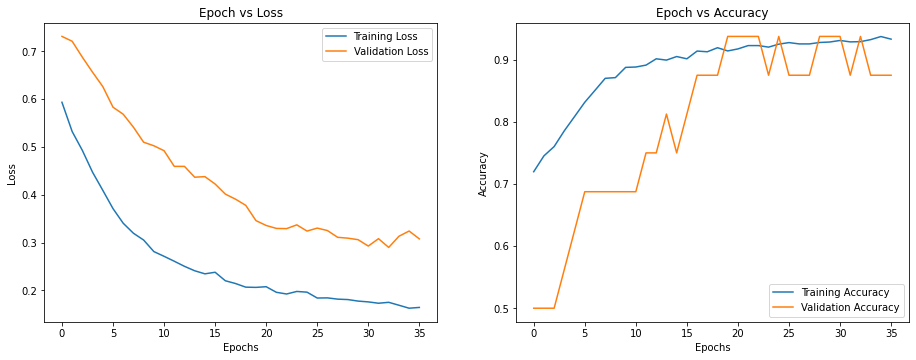

In [ ]:
train_loss, train_acc, validation_loss, validation_acc = train(
    vgg_model2, loss_fn, optimizer, 'cuda', train_loader, val_loader, 40,
    lr_scheduler_flag=True, early_stopping_flag=True
)
plot_loss_accuracy(train_loss, train_acc, validation_loss, validation_acc)

In [ ]:
with torch.no_grad():
    loss_sum = 0
    total_correct = 0
    total = len(test_image)
    for batch in test_loader:
      images, labels = batch
      images = images.to(DEVICE)
      labels = labels.to(DEVICE)
      output = vgg_model2(images)
      loss = loss_fn(output, labels)
      loss_sum += loss.item()

      predictions = torch.argmax(output, dim=1)

      num_correct = torch.sum(predictions == labels)
      total_correct += num_correct.cpu()

pct = total_correct / total
print(f'\n Final accuracy is {pct}')


 Final accuracy is 0.8541666865348816


In [ ]:
y_pred, y_true = get_y(vgg_model2, test_loader, DEVICE)
confusion_matrix_df = pd.DataFrame(confusion_matrix(y_true, y_pred))

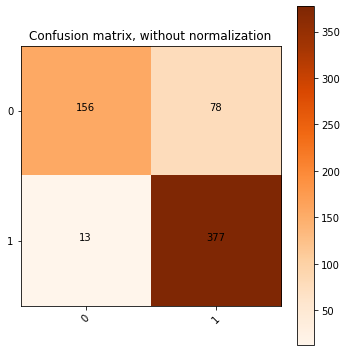

In [ ]:
# Compute confusion matrix
class_names_1 = np.unique(y_true)

cnf_matrix_1 = confusion_matrix(y_true=y_true, y_pred=y_pred)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure(figsize=(5,5))
plot_confusion_matrix(cnf_matrix_1, classes=class_names_1, title='Confusion matrix, without normalization')


In [ ]:
# Examine some classification metrics 
tn, fp, fn, tp = confusion_matrix(y_true=y_true, y_pred=y_pred).ravel()
print('Accuracy: {}'.format(round((tp+tn)/(tp+fp+tn+fn),4)))
print('Misclassification rate: {}'.format(round((fp+fn)/(tp+fp+tn+fn),4)))
print('Precision: {}'.format(round(tp/(tp+fp),4)))
print('Recall: {}'.format(round(tp/(tp+fn),4)))
print('Specificity: {}'.format(round(tn/(tn+fp),4)))

Accuracy: 0.8542
Misclassification rate: 0.1458
Precision: 0.8286
Recall: 0.9667
Specificity: 0.6667


This model achieves an accuracy of 0.8542 and Recall of 0.9667. The plot of accuracy and loss is showing the desired shape. This model is better than the last model 3 by introducting the early stop.

Next step, I will be using Transfer Learning VGG 19 from Keras and add additional layers after the Flatten layers.
I will only adopt the weights from Pre-Trained model before the Flatten layer.



|Model|---|HyperParameters|Epoch|Accuracy|Misclass|Precision|Recall|Specificity|Observation Accuracy|Observation on Loss|Remarks|
|---|---|---|---|---|---|---|---|---|---|---|---|
|Base Model|CNN-3 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005|40|0.7163|0.2837|0.6969|0.9667|0.2991|Train Accuracy increases and Test Accuracy decreases|Both Train and Test decreases|---|
|Model Selection|---|---|---|---|---|---|---|---|---|---|---|---|
|Model 1|CNN- 6 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005|40|0.7115|0.2885|0.6959|0.9564|0.3034|Train Accuracy increases and Test Accuracy decreases|Train loss decreases while Test loss increases|---|
|Model 2|CNN- 6 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005 |40|0.7408|0.2692|0.6996|0.9974|0.2863|Train Accuracy increases and Test Accuracy decreases|Train loss decreases while Test loss increases|---|
|Model 3|VGG-19|learning rate:1e-06, betas: (0.9, 0.999), epsilon: 1e-08, decay=0.000005|40|0.851|0.149|0.8293|0.959|0.6709|Train Accurancy increases and Test Accuracy increases|Train loss decreases while Test loss decreases|---|
|Model 4|VGG-19|learning rate:1e-06, betas: (0.9, 0.999), epsilon: 1e-08, decay=0.000005|40|0.8542|0.1458|0.8286|0.9667|0.6667|Train Accurancy increases and Test Accuracy increases|Train loss decreases while Test loss decreases|---|


Model 5 : In this model, I am using pre-trained VGG19 from Keras. By using Keras in Model 5 and Model 6, I am taking the opportunity to compare the same VGG-19 model from Keras and Pytorch. In model 5, I will remove some layers from the classifier layers.

<img src="model5.jpg"/>

In [ ]:
lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-6,
    decay_steps=100000,
    decay_rate=0.000005)

optimizer = keras.optimizers.Adam(learning_rate=lr_schedule)
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy()
callback = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=4)


In [ ]:
vgg_final = keras.applications.vgg19.VGG19(
   include_top = False,
   weights = 'imagenet',
   input_tensor = None, 
   input_shape = (224,224,3), 
   pooling = max, 
)
vgg_final.summary()


flatten_layer = layers.Flatten()
dense_layer_1 = layers.Dense(4096, activation='relu')
dense_layer_2 = layers.Dense(4096, activation='relu')
prediction_layer = layers.Dense(2, activation='softmax')


vgg_model4 = models.Sequential([
    vgg_final,
    flatten_layer,
    dense_layer_1,
    dense_layer_2,
    prediction_layer
])
vgg_model4.summary()
vgg_model4.compile(optimizer=optimizer,
              loss=loss_fn,
              metrics=['accuracy'])

epochs=40

history = vgg_model4.fit(training_batches,
  validation_data=validation_batches, epochs=epochs,callbacks=[callback]
)



loss, acc = vgg_model4.evaluate(test_batches)
print("Accuracy", acc)

80150528/80134624 [==============================] - 1s 0us/step
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [ ]:
scores = vgg_model4.evaluate(test_batches, verbose=0)
print("Score : %.2f%%" % (scores[1]*100))

Score : 79.81%


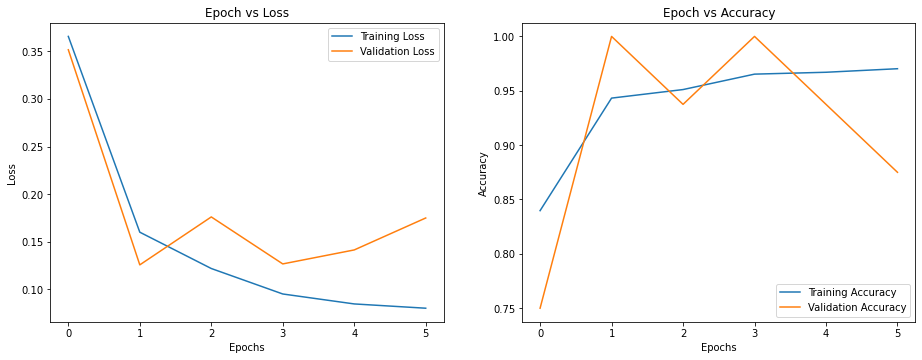

In [ ]:
# a plot on train/validate accuracy and loss verus epoch
plot_loss_accuracy(history.history['loss'], history.history['accuracy'], history.history['val_loss'], history.history['val_accuracy'])

In [ ]:
# compute confusion matrix
pred_classes_1 = vgg_model4.predict(test_batches)
pred1 = np.argmax(pred_classes_1, axis=-1)

print('Confusion Matrix')
print(confusion_matrix(test_batches.classes, pred1))
print('Classification Report')
target_names = ['NORMAL', 'PNEUMONIA']
print(classification_report(test_batches.classes, pred1, target_names=target_names))

Confusion Matrix
[[109 125]
 [  1 389]]
Classification Report
              precision    recall  f1-score   support

      NORMAL       0.99      0.47      0.63       234
   PNEUMONIA       0.76      1.00      0.86       390

    accuracy                           0.80       624
   macro avg       0.87      0.73      0.75       624
weighted avg       0.84      0.80      0.78       624



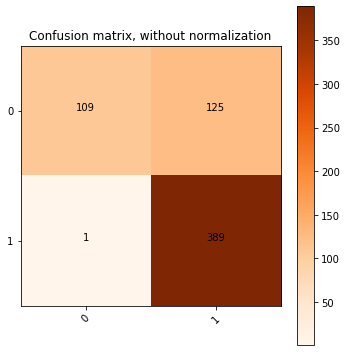

In [ ]:
# Compute confusion matrix
class_names_1 = np.unique(test_batches.classes)

cnf_matrix_1 = confusion_matrix(test_batches.classes, pred1)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure(figsize=(5,5))
plot_confusion_matrix(cnf_matrix_1, classes=class_names_1, title='Confusion matrix, without normalization')

In [ ]:
# Examine some classification metrics 
tn, fp, fn, tp = confusion_matrix(y_true=test_batches.classes, y_pred=pred1).ravel()
print('Accuracy: {}'.format(round((tp+tn)/(tp+fp+tn+fn),4)))
print('Misclassification rate: {}'.format(round((fp+fn)/(tp+fp+tn+fn),4)))
print('Precision: {}'.format(round(tp/(tp+fp),4)))
print('Recall: {}'.format(round(tp/(tp+fn),4)))
print('Specificity: {}'.format(round(tn/(tn+fp),4)))

Accuracy: 0.7981
Misclassification rate: 0.2019
Precision: 0.7568
Recall: 0.9974
Specificity: 0.4658


|Model|---|HyperParameters|Epoch|Accuracy|Misclass|Precision|Recall|Specificity|Observation Accuracy|Observation on Loss|Remarks|
|---|---|---|---|---|---|---|---|---|---|---|---|
|Base Model|CNN-3 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005|40|0.7163|0.2837|0.6969|0.9667|0.2991|Train Accuracy increases and Test Accuracy decreases|Both Train and Test decreases|---|
|Model Selection|---|---|---|---|---|---|---|---|---|---|---|---|
|Model 1|CNN- 6 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005|40|0.7115|0.2885|0.6959|0.9564|0.3034|Train Accuracy increases and Test Accuracy decreases|Train loss decreases while Test loss increases|---|
|Model 2|CNN- 6 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005 |40|0.7408|0.2692|0.6996|0.9974|0.2863|Train Accuracy increases and Test Accuracy decreases|Train loss decreases while Test loss increases|---|
|Model 3|VGG-19|learning rate:1e-06, betas: (0.9, 0.999), epsilon: 1e-08, decay=0.000005|40|0.851|0.149|0.8293|0.959|0.6709|Train Accurancy increases and Test Accuracy increases|Train loss decreases while Test loss decreases|---|
|Model 4|VGG-19|learning rate:1e-06, betas: (0.9, 0.999), epsilon: 1e-08, decay=0.000005|40|0.8542|0.1458|0.8286|0.9667|0.6667|Train Accurancy increases and Test Accuracy increases|Train loss decreases while Test loss decreases|---|
|Model 5|VGG-19|learning_rate=1e-06, betas: (0.9, 0.999), epsilon=1e-08, decay=0.000005|40|0.7981|0.2019|0.7568|0.9974|0.4658|Train Accurancy increases and Test Accuracy increases|Train loss decreases while Test loss decreases|---|

Model 6: VGG from Keras. In this model, I will add in additional layers in the Classifier layers.

<img src="model6.jpg"/>



In [23]:
lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-6,
    decay_steps=100000,
    decay_rate=0.000005)

optimizer = keras.optimizers.Adam(learning_rate=lr_schedule)
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy()
callback = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)


In [25]:
vgg_final = keras.applications.vgg19.VGG19(
   include_top = False,
   weights = 'imagenet',
   input_tensor = None, 
   input_shape = (224,224,3), 
   pooling = max, 
  
)
vgg_final.summary()

flatten_layer = layers.Flatten()
dense_layer_1 = layers.Dense(4096, activation='relu')
drop_layer_1 = layers.Dropout(0.2)
batch_layer_1 = layers.BatchNormalization()
dense_layer_2 = layers.Dense(4096, activation='relu')
drop_layer_2 = layers.Dropout(0.2)
batch_layer_2 = layers.BatchNormalization()
dense_layer_3 = layers.Dense(4096, activation='relu')
drop_layer_3 = layers.Dropout(0.1)
batch_layer_3 = layers.BatchNormalization()
prediction_layer = layers.Dense(2, activation='softmax')


vgg_model6 = models.Sequential([
    vgg_final,
    flatten_layer,
    dense_layer_1,
    drop_layer_1,
    batch_layer_1,
    dense_layer_2,
    drop_layer_2,
    batch_layer_2,
    dense_layer_3,
    drop_layer_3,
    batch_layer_3,
    prediction_layer
])
vgg_model6.summary()
vgg_model6.compile(optimizer=optimizer,
              loss=loss_fn,
              metrics=['accuracy'])



epochs=40

history = vgg_model6.fit(training_batches,
  validation_data=validation_batches, epochs=epochs, batch_size=20,callbacks=[callback]
)

loss, acc = vgg_model6.evaluate(test_batches)
print("Accuracy", acc)



Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [26]:
scores = vgg_model6.evaluate(test_batches, verbose=0)
print("Score : %.2f%%" % (scores[1]*100))

Score : 88.14%


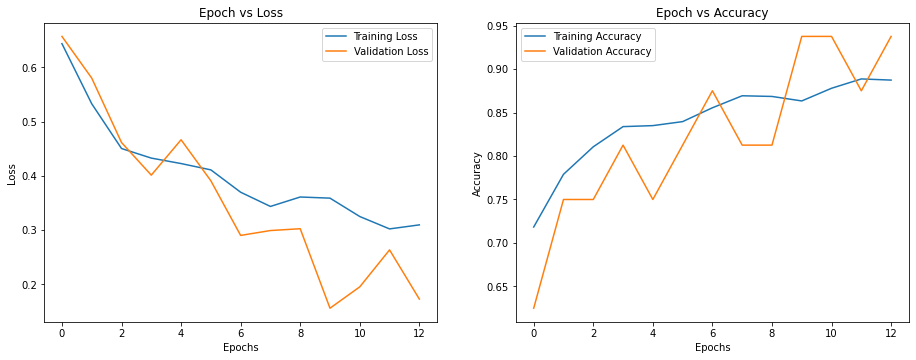

In [27]:
# a plot on train/validate accuracy and loss verus epoch
plot_loss_accuracy(history.history['loss'], history.history['accuracy'], history.history['val_loss'], history.history['val_accuracy'])


It is possible that the training accuracy is lower than the validation one, because in the current implementation the former is computed by using sampling (for efficiency purpose) but the latter not. The sampling results in an approximation that is consistent but not unbiased, and hence the approximation may be far from the truth. 

When trainng a deep neural network, we often apply regularization to help our model
1. Obtain higher validation/testing accuracy
2. Ideally, to generalize better to the data outside the validation and testing sets

Regularization methods often sacrifice training accuracy to improve validation accuracy- in some cases that can lead to your validation loss being lower than your training loss

In [28]:
# compute confusion matrix
pred_classes_1 = vgg_model6.predict(test_batches)
pred1 = np.argmax(pred_classes_1, axis=-1)

print('Confusion Matrix')
print(confusion_matrix(test_batches.classes, pred1))
print('Classification Report')
target_names = ['NORMAL', 'PNEUMONIA']
print(classification_report(test_batches.classes, pred1, target_names=target_names))

Confusion Matrix
[[183  51]
 [ 23 367]]
Classification Report
              precision    recall  f1-score   support

      NORMAL       0.89      0.78      0.83       234
   PNEUMONIA       0.88      0.94      0.91       390

    accuracy                           0.88       624
   macro avg       0.88      0.86      0.87       624
weighted avg       0.88      0.88      0.88       624



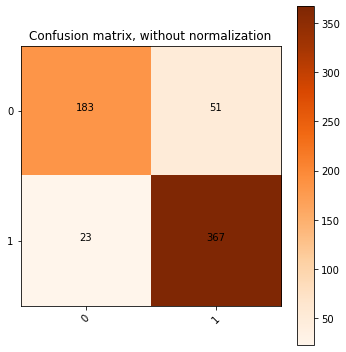

In [29]:
# Compute confusion matrix
class_names_1 = np.unique(test_batches.classes)

cnf_matrix_1 = confusion_matrix(test_batches.classes, pred1)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure(figsize=(5,5))
plot_confusion_matrix(cnf_matrix_1, classes=class_names_1, title='Confusion matrix, without normalization')

In [30]:
# Examine some classification metrics 
tn, fp, fn, tp = confusion_matrix(y_true=test_batches.classes, y_pred=pred1).ravel()
print('Accuracy: {}'.format(round((tp+tn)/(tp+fp+tn+fn),4)))
print('Misclassification rate: {}'.format(round((fp+fn)/(tp+fp+tn+fn),4)))
print('Precision: {}'.format(round(tp/(tp+fp),4)))
print('Recall: {}'.format(round(tp/(tp+fn),4)))
print('Specificity: {}'.format(round(tn/(tn+fp),4)))

Accuracy: 0.8814
Misclassification rate: 0.1186
Precision: 0.878
Recall: 0.941
Specificity: 0.7821


In model 6, the accuracy has improved with the additional classifer layers compared to model 5. The accuracy is 0.8814 and Recall is 0.941 which is the best among all the models.

|Model|---|HyperParameters|Epoch|Accuracy|Misclass|Precision|Recall|Specificity|Observation Accuracy|Observation on Loss|Remarks|
|---|---|---|---|---|---|---|---|---|---|---|---|
|Base Model|CNN-3 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005|40|0.7163|0.2837|0.6969|0.9667|0.2991|Train Accuracy increases and Test Accuracy decreases|Both Train and Test decreases|---|
|Model Selection|---|---|---|---|---|---|---|---|---|---|---|---|
|Model 1|CNN- 6 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005|40|0.7115|0.2885|0.6959|0.9564|0.3034|Train Accuracy increases and Test Accuracy decreases|Train loss decreases while Test loss increases|---|
|Model 2|CNN- 6 layers|learning_rate=0.000001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.000005 |40|0.7408|0.2692|0.6996|0.9974|0.2863|Train Accuracy increases and Test Accuracy decreases|Train loss decreases while Test loss increases|---|
|Model 3|VGG-19|learning rate:1e-06, betas: (0.9, 0.999), epsilon: 1e-08, decay=0.000005|40|0.851|0.149|0.8293|0.959|0.6709|Train Accurancy increases and Test Accuracy increases|Train loss decreases while Test loss decreases|---|
|Model 4|VGG-19|learning rate:1e-06, betas: (0.9, 0.999), epsilon: 1e-08, decay=0.000005|40|0.8542|0.1458|0.8286|0.9667|0.6667|Train Accurancy increases and Test Accuracy increases|Train loss decreases while Test loss decreases|---|
|Model 5|VGG-19|learning_rate=1e-06, betas: (0.9, 0.999), epsilon=1e-08, decay=0.000005|40|0.7981|0.2019|0.7568|0.9974|0.4658|Train Accurancy increases and Test Accuracy increases|Train loss decreases while Test loss decreases|---|
|Model 6|VGG-19|learning_rate=1e-06, betas: (0.9, 0.999), epsilon=1e-08, decay=0.000005|40|0.8814|0.1186|0.878|0.941|0.7821|Train Accurancy increases and Test Accuracy increases|Train loss decreases while Test loss decreases|---|

In [31]:
# List down the misclassified and correctly classified
# now storing some properly as well as misclassified indexes'.
i=0
prop_class=[]
mis_class=[]

for i in range(len(pred1)):
    if(test_batches.classes[i] == pred1[i]):
        prop_class.append(i)
   

i=0
for i in range(len(pred1)):
    if(test_batches.classes[i] != pred1[i]):
        mis_class.append(i)

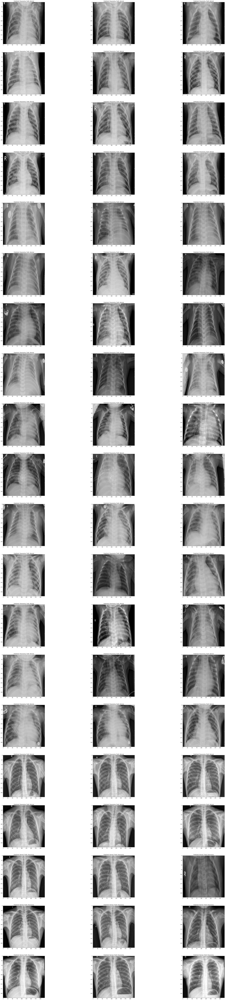

In [37]:
# Wrongly Classified

def labeltxt(id):
  if id>0:
    return "Pneunomia"
  else:
    return "Normal"

fig,ax=plt.subplots(20,3)
fig.set_size_inches(50,200)
count=0
img, label = test_batches.next()
i=0
j=0
k=0
for count in range(60):
   for i in range (len(test_batches.classes)):
    if (i==mis_class[count]) and (count<60):
      if j>2:
        j=0
      ax[k,j].imshow(img[0])
      ax[k,j].set_title("Predicted: {}, Truth: {}".format(labeltxt(pred1[mis_class[count]]), labeltxt(test_batches.classes[mis_class[count]])))
      exit
   j=j+1
   if j==3:
     k=k+1
   
   img, label = test_batches.next()
    


## Error Analysis

The white spots in the pneumonic X-ray, called infiltrates, distinguish a pneumonic from a healthy condition. However, chest X-ray examinations for pneumonia detection are prone to subjective variability. Thus, an automated system for the detection of pneumonia is required. In this study, I developed a deep transfer learning models for the accurate classification of chest X-ray images.
Above shows mis-classified imagesin test dataset where the model failed to classify the samples correctly. This may be due to the poor image quality, where the contrast of the image is not adequate, resulting in the base learners classifying the sample incorrectly.

A pneumonic lung X-ray is characterized by abscesses or pleural effusion, that is, fluid in the alveoli, which appears as white spots in a lung X-ray, as explained. It is plausible that such an early stage of pneumonia, where the white infiltrates have just started to appear sparingly in the lungs, was not captured by the CNN models.

## Summary

In this prototype, I started with a baseline model using CNN model. Then, I tuned the model to get a better performance. When I first started to use the raw data to perform the model training. The result is not desirable. 
Thus, data augmentation is necesary to bring out the contrast between a Normal Case and a Pneunomia Case. CNN model built from scratch may not be a desirable model as large amount of data is necessary to acquire the desired accuracy.

Such a vast amount of labeled data is difficult to acquire because it requires that expert doctors classify each image, which is an expensive and time-consuming task. Transfer learning is a work-around to surmount this obstacle. So in order to solve a problem that involves a small dataset, a model trained on a large dataset is re-used and the network weights determined in this model are applied. VGG-19 models trained on a large dataset such as ImageNet, which consists of more than 14 million images, are used for this biomedical image classification tasks. The final model is taking weights from the pre-trained model. I introduced additional layers after the Flatten layer so as to customise the weights to the X-Ray images.

I tried VGG-19 models from Keras and Pytorch. Pytorch is performing much faster and is suitable for large datasets as compared to Keras. Keras is much easier to configure compared to Pytorch but the result is not so consistent.

Although the accuracy is relatively acceptable. There are stil room for improvement. In the future, we may investigate techniques such as contrast enhancement of the images or other pre-processing steps to improve the image quality. I will consider using segmentation of the lung image before classification to enable the CNN models to achieve improved feature extraction. Furthermore, because three CNN models are required to train the proposed ensemble, the computation cost is higher than that of the CNN baselines developed in studies in the literature. In the future, we may attempt to reduce the computational requirements by employing methods such as snapshot ensembling